In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Training set
image_dir = "/content/drive/MyDrive/Fire_Image_Dataset/images_prepped_train"
mask_dir  = "/content/drive/MyDrive/Fire_Image_Dataset/annotations_prepped_train"

# Testing set (if you need it later)
test_image_dir = "/content/drive/MyDrive/Fire_Image_Dataset/images_prepped_test"
test_mask_dir  = "/content/drive/MyDrive/Fire_Image_Dataset/annotations_prepped_test"


In [ ]:
import os

print("Train images folder exists:", os.path.exists(image_dir))
print("Train masks folder exists:", os.path.exists(mask_dir))
print("Test images folder exists:", os.path.exists(test_image_dir))
print("Test masks folder exists:", os.path.exists(test_mask_dir))

Train images folder exists: True
Train masks folder exists: True
Test images folder exists: True
Test masks folder exists: True


In [ ]:
import numpy as np
from PIL import Image
from tqdm import tqdm
import os

def load_data(image_dir, mask_dir, img_size=(256,256)):
    """Loads and resizes images + masks."""
    image_files = sorted([f for f in os.listdir(image_dir) if f.endswith(('.png','.jpg','.jpeg'))])
    mask_files  = sorted([f for f in os.listdir(mask_dir)  if f.endswith(('.png','.jpg','.jpeg'))])

    X, y = [], []
    for img_name, mask_name in tqdm(zip(image_files, mask_files), total=len(image_files)):
        img  = Image.open(os.path.join(image_dir, img_name)).convert('RGB').resize(img_size)
        mask = Image.open(os.path.join(mask_dir, mask_name)).convert('L').resize(img_size)

        img  = np.array(img)/255.0
        mask = (np.array(mask)>127).astype(np.uint8)[...,None]

        X.append(img)
        y.append(mask)

    return np.array(X,dtype=np.float32), np.array(y,dtype=np.float32)

# Load your training data
X, y = load_data(image_dir, mask_dir, img_size=(128,128))
print("Images:", X.shape, "Masks:", y.shape)


100%|██████████| 500/500 [00:30<00:00, 16.15it/s]


Images: (500, 128, 128, 3) Masks: (500, 128, 128, 1)


Train: (400, 128, 128, 3) (400, 128, 128, 1)
Val:   (100, 128, 128, 3) (100, 128, 128, 1)


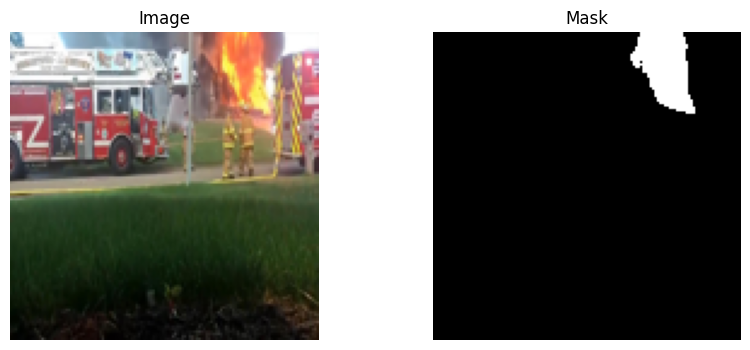

In [ ]:
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

print("Train:", X_train.shape, y_train.shape)
print("Val:  ", X_val.shape, y_val.shape)

# Show a sample
i = 0
plt.figure(figsize=(10,4))
plt.subplot(1,2,1); plt.imshow(X_train[i]); plt.title("Image"); plt.axis("off")
plt.subplot(1,2,2); plt.imshow(y_train[i].squeeze(), cmap="gray"); plt.title("Mask"); plt.axis("off")
plt.show()


In [ ]:
#Import libraries + setup basic hyperparameters
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
import matplotlib.pyplot as plt
import numpy as np

# ----- Hyperparameters -----
IMG_HEIGHT, IMG_WIDTH = X_train.shape[1], X_train.shape[2]

BATCH_SIZE = 8
EPOCHS = 25
LR = 1e-3
AUTOTUNE = tf.data.AUTOTUNE


In [ ]:
#Dice coefficient and loss functions
# ----- Dice coefficient -----
def dice_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

def bce_dice_loss(y_true, y_pred):
    bce = tf.keras.losses.BinaryCrossentropy()(y_true, y_pred)
    return bce + dice_loss(y_true, y_pred)


In [ ]:
#Define U-Net building blocks

def conv_block(x, filters):
    x = layers.Conv2D(filters, 3, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    x = layers.Conv2D(filters, 3, padding='same', activation='relu')(x)
    x = layers.BatchNormalization()(x)
    return x

def encoder_block(x, filters):
    c = conv_block(x, filters)
    p = layers.MaxPooling2D((2,2))(c)
    return c, p

def decoder_block(x, skip, filters):
    x = layers.Conv2DTranspose(filters, (2,2), strides=(2,2), padding='same')(x)
    x = layers.Concatenate()([x, skip])
    x = conv_block(x, filters)
    return x


In [ ]:
# Build the Full U-Net model
def build_unet(input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)):
    inputs = layers.Input(input_shape)
    # Encoder
    c1, p1 = encoder_block(inputs, 64)
    c2, p2 = encoder_block(p1, 128)
    c3, p3 = encoder_block(p2, 256)
    c4, p4 = encoder_block(p3, 512)
    # Bridge
    b = conv_block(p4, 1024)
    # Decoder
    d1 = decoder_block(b, c4, 512)
    d2 = decoder_block(d1, c3, 256)
    d3 = decoder_block(d2, c2, 128)
    d4 = decoder_block(d3, c1, 64)
    # Output
    outputs = layers.Conv2D(1, (1,1), activation='sigmoid')(d4)
    model = Model(inputs, outputs)
    return model

model = build_unet((IMG_HEIGHT, IMG_WIDTH, 3))
model.compile(optimizer=Adam(LR), loss=bce_dice_loss, metrics=[dice_coef, 'accuracy'])
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 128, 128,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 128, 128,  │      1,792 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 128, 128,  │        256 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 128, 128,  │     36,928 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        256 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 64, 64,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 64, 64,    │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 64, 64,    │    147,584 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64, 64,    │        512 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 32, 32,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 32, 32,    │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │      1,024 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 32, 32,    │    590,080 │ batch_normalizat… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 32, 32,    │      1,024 │ conv2d_5[0][0]    │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 16, 16,    │          0 │ batch_normalizat… │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 16, 16,    │  1,180,160 │ max_pooling2d_2[

 Total params: 31,055,297 (118.47 MB)

 Trainable params: 31,043,521 (118.42 MB)

 Non-trainable params: 11,776 (46.00 KB)

In [ ]:
#Create TensorFlow datasets
# ----- TF Dataset pipeline -----
def make_dataset(X, y, batch_size=BATCH_SIZE, augment=False, shuffle=False):
    ds = tf.data.Dataset.from_tensor_slices((X, y))
    if shuffle:
        ds = ds.shuffle(buffer_size=len(X), seed=42)

    def _preprocess(img, mask):
        img = tf.cast(img, tf.float32)
        mask = tf.cast(mask, tf.float32)
        return img, mask

    def _augment(img, mask):
        if tf.random.uniform(()) > 0.5:
            img = tf.image.flip_left_right(img)
            mask = tf.image.flip_left_right(mask)
        if tf.random.uniform(()) > 0.5:
            img = tf.image.flip_up_down(img)
            mask = tf.image.flip_up_down(mask)
        img = tf.image.random_brightness(img, max_delta=0.1)
        return img, mask

    ds = ds.map(_preprocess, num_parallel_calls=AUTOTUNE)
    if augment:
        ds = ds.map(lambda i,m: _augment(i,m), num_parallel_calls=AUTOTUNE)
    ds = ds.batch(batch_size).prefetch(AUTOTUNE)
    return ds

train_ds = make_dataset(X_train, y_train, augment=True, shuffle=True)
val_ds   = make_dataset(X_val, y_val, augment=False, shuffle=False)


In [ ]:
# ----- Callbacks -----
checkpoint_cb = ModelCheckpoint("unet_best.h5", save_best_only=True,
                                monitor="val_dice_coef", mode="max", verbose=1)
earlystop_cb  = EarlyStopping(monitor="val_dice_coef", mode="max",
                              patience=8, restore_best_weights=True, verbose=1)
reduce_cb     = ReduceLROnPlateau(monitor="val_loss", factor=0.5,
                                  patience=4, verbose=1)


In [ ]:
# Train the Model
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
    callbacks=[checkpoint_cb, earlystop_cb, reduce_cb]
)

# ✅ After training, save the final version too
final_path = os.path.join(save_dir, "unet_final.h5")
model.save(final_path)
print("✅ Model saved successfully at:", final_path)


Epoch 1/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.8255 - dice_coef: 0.2438 - loss: 1.3139 
Epoch 1: val_dice_coef improved from -inf to 0.08882, saving model to unet_best.h5


50/50 ━━━━━━━━━━━━━━━━━━━━ 873s 17s/step - accuracy: 0.8273 - dice_coef: 0.2450 - loss: 1.3101 - val_accuracy: 0.1541 - val_dice_coef: 0.0888 - val_loss: 10.0185 - learning_rate: 0.0010
Epoch 2/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9623 - dice_coef: 0.3950 - loss: 0.9077 
Epoch 2: val_dice_coef did not improve from 0.08882
50/50 ━━━━━━━━━━━━━━━━━━━━ 846s 17s/step - accuracy: 0.9624 - dice_coef: 0.3960 - loss: 0.9061 - val_accuracy: 0.0427 - val_dice_coef: 0.0798 - val_loss: 1194.4847 - learning_rate: 0.0010
Epoch 3/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9730 - dice_coef: 0.5282 - loss: 0.6916 
Epoch 3: val_dice_coef did not improve from 0.08882
50/50 ━━━━━━━━━━━━━━━━━━━━ 885s 17s/step - accuracy: 0.9730 - dice_coef: 0.5288 - loss: 0.6904 - val_accuracy: 0.9368 - val_dice_coef: 0.0229 - val_loss: 1.2066 - learning_rate: 0.0010
Epoch 4/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9751 - dice_coef: 0.6488 - loss: 0.5004 
Epoch 4: val_dice_coef

50/50 ━━━━━━━━━━━━━━━━━━━━ 852s 17s/step - accuracy: 0.9765 - dice_coef: 0.6824 - loss: 0.4571 - val_accuracy: 0.6162 - val_dice_coef: 0.1139 - val_loss: 3.6653 - learning_rate: 0.0010
Epoch 6/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9771 - dice_coef: 0.7404 - loss: 0.3679 
Epoch 6: val_dice_coef did not improve from 0.11393
50/50 ━━━━━━━━━━━━━━━━━━━━ 855s 17s/step - accuracy: 0.9771 - dice_coef: 0.7402 - loss: 0.3681 - val_accuracy: 0.9573 - val_dice_coef: 0.0042 - val_loss: 1.2758 - learning_rate: 0.0010
Epoch 7/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9763 - dice_coef: 0.7643 - loss: 0.3336 
Epoch 7: val_dice_coef did not improve from 0.11393

Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
50/50 ━━━━━━━━━━━━━━━━━━━━ 846s 17s/step - accuracy: 0.9763 - dice_coef: 0.7640 - loss: 0.3340 - val_accuracy: 0.8801 - val_dice_coef: 0.1133 - val_loss: 1.3685 - learning_rate: 0.0010
Epoch 8/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - ac

50/50 ━━━━━━━━━━━━━━━━━━━━ 844s 17s/step - accuracy: 0.9789 - dice_coef: 0.7592 - loss: 0.3361 - val_accuracy: 0.9785 - val_dice_coef: 0.6327 - val_loss: 0.4376 - learning_rate: 5.0000e-04
Epoch 9/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9777 - dice_coef: 0.7650 - loss: 0.3257 
Epoch 9: val_dice_coef improved from 0.63272 to 0.65471, saving model to unet_best.h5


50/50 ━━━━━━━━━━━━━━━━━━━━ 862s 17s/step - accuracy: 0.9777 - dice_coef: 0.7653 - loss: 0.3252 - val_accuracy: 0.9788 - val_dice_coef: 0.6547 - val_loss: 0.4136 - learning_rate: 5.0000e-04
Epoch 10/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9809 - dice_coef: 0.8030 - loss: 0.2725 
Epoch 10: val_dice_coef improved from 0.65471 to 0.69281, saving model to unet_best.h5


50/50 ━━━━━━━━━━━━━━━━━━━━ 864s 17s/step - accuracy: 0.9809 - dice_coef: 0.8030 - loss: 0.2726 - val_accuracy: 0.9807 - val_dice_coef: 0.6928 - val_loss: 0.3689 - learning_rate: 5.0000e-04
Epoch 11/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9833 - dice_coef: 0.7846 - loss: 0.2847 
Epoch 11: val_dice_coef improved from 0.69281 to 0.72404, saving model to unet_best.h5


50/50 ━━━━━━━━━━━━━━━━━━━━ 935s 18s/step - accuracy: 0.9833 - dice_coef: 0.7850 - loss: 0.2843 - val_accuracy: 0.9821 - val_dice_coef: 0.7240 - val_loss: 0.3333 - learning_rate: 5.0000e-04
Epoch 12/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9819 - dice_coef: 0.8184 - loss: 0.2478 
Epoch 12: val_dice_coef improved from 0.72404 to 0.76096, saving model to unet_best.h5


50/50 ━━━━━━━━━━━━━━━━━━━━ 849s 17s/step - accuracy: 0.9820 - dice_coef: 0.8184 - loss: 0.2478 - val_accuracy: 0.9839 - val_dice_coef: 0.7610 - val_loss: 0.2922 - learning_rate: 5.0000e-04
Epoch 13/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9818 - dice_coef: 0.8223 - loss: 0.2486 
Epoch 13: val_dice_coef improved from 0.76096 to 0.77073, saving model to unet_best.h5


50/50 ━━━━━━━━━━━━━━━━━━━━ 884s 17s/step - accuracy: 0.9819 - dice_coef: 0.8223 - loss: 0.2485 - val_accuracy: 0.9839 - val_dice_coef: 0.7707 - val_loss: 0.2789 - learning_rate: 5.0000e-04
Epoch 14/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9842 - dice_coef: 0.8298 - loss: 0.2310 
Epoch 14: val_dice_coef improved from 0.77073 to 0.77943, saving model to unet_best.h5


50/50 ━━━━━━━━━━━━━━━━━━━━ 900s 17s/step - accuracy: 0.9842 - dice_coef: 0.8297 - loss: 0.2312 - val_accuracy: 0.9858 - val_dice_coef: 0.7794 - val_loss: 0.2714 - learning_rate: 5.0000e-04
Epoch 15/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9831 - dice_coef: 0.8416 - loss: 0.2239 
Epoch 15: val_dice_coef did not improve from 0.77943
50/50 ━━━━━━━━━━━━━━━━━━━━ 860s 17s/step - accuracy: 0.9831 - dice_coef: 0.8414 - loss: 0.2241 - val_accuracy: 0.9814 - val_dice_coef: 0.7458 - val_loss: 0.3142 - learning_rate: 5.0000e-04
Epoch 16/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9832 - dice_coef: 0.8360 - loss: 0.2297 
Epoch 16: val_dice_coef improved from 0.77943 to 0.82787, saving model to unet_best.h5


50/50 ━━━━━━━━━━━━━━━━━━━━ 850s 17s/step - accuracy: 0.9832 - dice_coef: 0.8359 - loss: 0.2297 - val_accuracy: 0.9885 - val_dice_coef: 0.8279 - val_loss: 0.2104 - learning_rate: 5.0000e-04
Epoch 17/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9849 - dice_coef: 0.8360 - loss: 0.2192 
Epoch 17: val_dice_coef did not improve from 0.82787
50/50 ━━━━━━━━━━━━━━━━━━━━ 867s 17s/step - accuracy: 0.9849 - dice_coef: 0.8360 - loss: 0.2193 - val_accuracy: 0.9867 - val_dice_coef: 0.8108 - val_loss: 0.2391 - learning_rate: 5.0000e-04
Epoch 18/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9845 - dice_coef: 0.8358 - loss: 0.2252 
Epoch 18: val_dice_coef did not improve from 0.82787
50/50 ━━━━━━━━━━━━━━━━━━━━ 851s 17s/step - accuracy: 0.9845 - dice_coef: 0.8359 - loss: 0.2250 - val_accuracy: 0.9848 - val_dice_coef: 0.8008 - val_loss: 0.2529 - learning_rate: 5.0000e-04
Epoch 19/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9850 - dice_coef: 0.8482 - loss: 0.2087 
Epoch 19:

50/50 ━━━━━━━━━━━━━━━━━━━━ 897s 18s/step - accuracy: 0.9840 - dice_coef: 0.8487 - loss: 0.2122 - val_accuracy: 0.9887 - val_dice_coef: 0.8451 - val_loss: 0.1925 - learning_rate: 2.5000e-04
Epoch 23/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9843 - dice_coef: 0.8402 - loss: 0.2194 
Epoch 23: val_dice_coef improved from 0.84508 to 0.84575, saving model to unet_best.h5


50/50 ━━━━━━━━━━━━━━━━━━━━ 847s 17s/step - accuracy: 0.9843 - dice_coef: 0.8403 - loss: 0.2192 - val_accuracy: 0.9888 - val_dice_coef: 0.8458 - val_loss: 0.1929 - learning_rate: 2.5000e-04
Epoch 24/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9868 - dice_coef: 0.8608 - loss: 0.1845 
Epoch 24: val_dice_coef did not improve from 0.84575
50/50 ━━━━━━━━━━━━━━━━━━━━ 858s 17s/step - accuracy: 0.9868 - dice_coef: 0.8607 - loss: 0.1847 - val_accuracy: 0.9881 - val_dice_coef: 0.8433 - val_loss: 0.1965 - learning_rate: 2.5000e-04
Epoch 25/25
50/50 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9859 - dice_coef: 0.8513 - loss: 0.1991 
Epoch 25: val_dice_coef improved from 0.84575 to 0.84664, saving model to unet_best.h5


50/50 ━━━━━━━━━━━━━━━━━━━━ 895s 18s/step - accuracy: 0.9858 - dice_coef: 0.8513 - loss: 0.1992 - val_accuracy: 0.9887 - val_dice_coef: 0.8466 - val_loss: 0.1935 - learning_rate: 2.5000e-04
Restoring model weights from the end of the best epoch: 25.


NameError: name 'save_dir' is not defined

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step


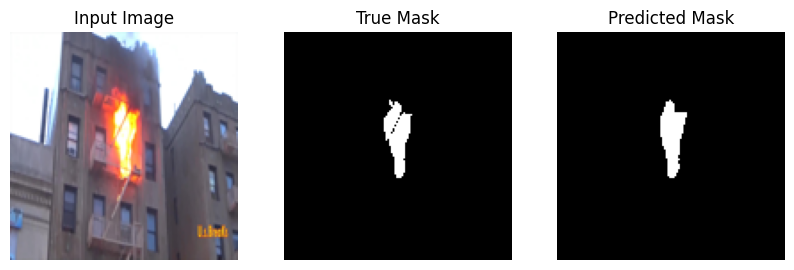

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 518ms/step


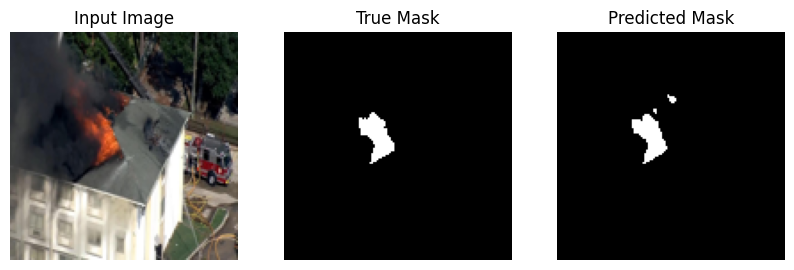

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 490ms/step


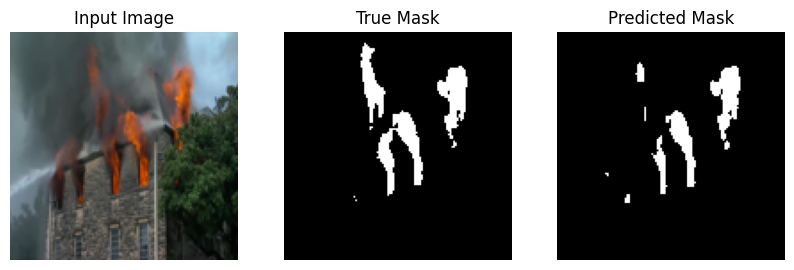

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


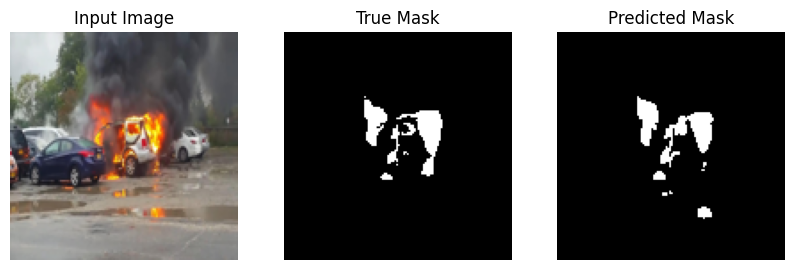

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


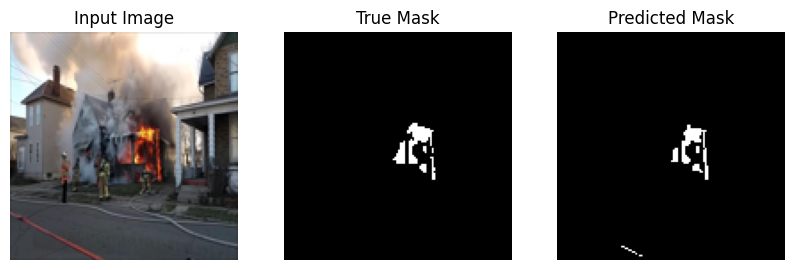

✅ Saved 5 predicted masks to: /content/drive/MyDrive/Fire_UNet_Models/Predicted_Masks


In [ ]:
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

# Folder in Google Drive to store prediction outputs
pred_dir = "/content/drive/MyDrive/Fire_UNet_Models/Predicted_Masks"
os.makedirs(pred_dir, exist_ok=True)

# Predict on a few validation samples
n_samples = 5  # number of images to save
idxs = np.random.choice(len(X_val), n_samples, replace=False)

for i, idx in enumerate(idxs):
    img = X_val[idx]
    mask_true = y_val[idx].squeeze()

    # Model prediction
    pred = model.predict(np.expand_dims(img, axis=0))[0].squeeze()
    pred_mask = (pred > 0.5).astype(np.uint8) * 255

    # Save predicted mask to Drive
    save_path = os.path.join(pred_dir, f"pred_{i+1}.png")
    Image.fromarray(pred_mask).save(save_path)

    # Optional: show comparison
    plt.figure(figsize=(10,3))
    plt.subplot(1,3,1); plt.imshow(img); plt.title("Input Image"); plt.axis('off')
    plt.subplot(1,3,2); plt.imshow(mask_true, cmap='gray'); plt.title("True Mask"); plt.axis('off')
    plt.subplot(1,3,3); plt.imshow(pred_mask, cmap='gray'); plt.title("Predicted Mask"); plt.axis('off')
    plt.show()

print(f"✅ Saved {n_samples} predicted masks to:", pred_dir)


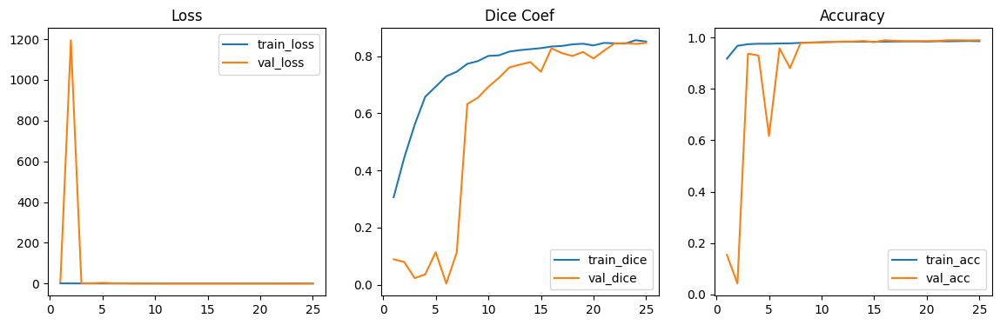

In [ ]:
# ----- Plot curves -----
def plot_history(history):
    hist = history.history
    epochs_range = range(1, len(hist['loss'])+1)

    plt.figure(figsize=(14,4))
    plt.subplot(1,3,1)
    plt.plot(epochs_range, hist['loss'], label='train_loss')
    plt.plot(epochs_range, hist['val_loss'], label='val_loss')
    plt.legend(); plt.title('Loss')

    plt.subplot(1,3,2)
    plt.plot(epochs_range, hist['dice_coef'], label='train_dice')
    plt.plot(epochs_range, hist['val_dice_coef'], label='val_dice')
    plt.legend(); plt.title('Dice Coef')

    plt.subplot(1,3,3)
    plt.plot(epochs_range, hist['accuracy'], label='train_acc')
    plt.plot(epochs_range, hist['val_accuracy'], label='val_acc')
    plt.legend(); plt.title('Accuracy')
    plt.show()

plot_history(history)


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


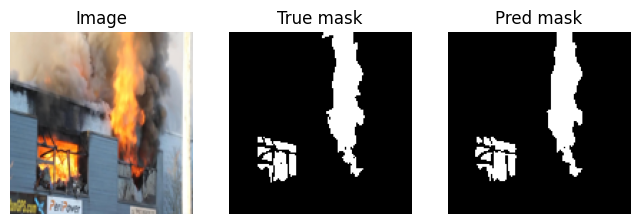

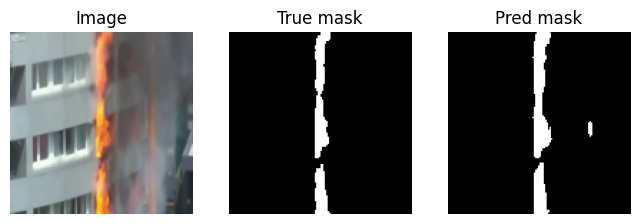

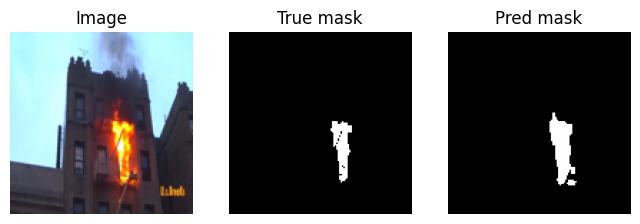

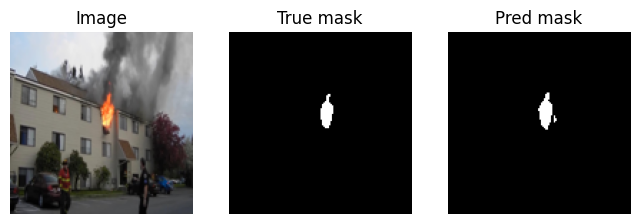

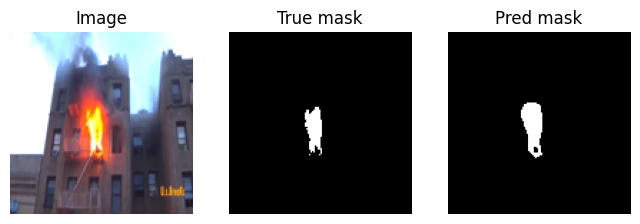

In [ ]:
# ----- Quick visualization of predictions -----
def show_predictions(model, X_val, y_val, n=3):
    idxs = np.random.choice(len(X_val), n, replace=False)
    preds = model.predict(X_val[idxs])
    for i, (img, true_mask, pred) in enumerate(zip(X_val[idxs], y_val[idxs], preds)):
        plt.figure(figsize=(8,3))
        plt.subplot(1,3,1); plt.imshow(img); plt.title("Image"); plt.axis('off')
        plt.subplot(1,3,2); plt.imshow(true_mask.squeeze(), cmap='gray'); plt.title("True mask"); plt.axis('off')
        plt.subplot(1,3,3); plt.imshow((pred.squeeze()>0.5).astype(np.uint8), cmap='gray'); plt.title("Pred mask"); plt.axis('off')
        plt.show()

show_predictions(model, X_val, y_val, n=5)


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import numpy as np

# 🔹 Step 1: Predict on the validation set
y_pred = model.predict(X_val, verbose=1)

# 🔹 Step 2: Convert probabilities to binary (0 or 1)
y_pred_bin = (y_pred > 0.5).astype(np.uint8)
y_true_bin = y_val.astype(np.uint8)

# 🔹 Step 3: Flatten arrays for metric computation
y_true_flat = y_true_bin.flatten()
y_pred_flat = y_pred_bin.flatten()

# 🔹 Step 4: Compute metrics
accuracy = accuracy_score(y_true_flat, y_pred_flat)
precision = precision_score(y_true_flat, y_pred_flat, zero_division=0)
recall = recall_score(y_true_flat, y_pred_flat, zero_division=0)
f1 = f1_score(y_true_flat, y_pred_flat, zero_division=0)

# 🔹 Step 5: Print results
print("📊 Model Performance on Validation Set:")
print(f"✅ Accuracy : {accuracy:.4f}")
print(f"✅ Precision: {precision:.4f}")
print(f"✅ Recall   : {recall:.4f}")
print(f"✅ F1 Score : {f1:.4f}")


4/4 ━━━━━━━━━━━━━━━━━━━━ 55s 12s/step
📊 Model Performance on Validation Set:
✅ Accuracy : 0.9889
✅ Precision: 0.8722
✅ Recall   : 0.8664
✅ F1 Score : 0.8693


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 974ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


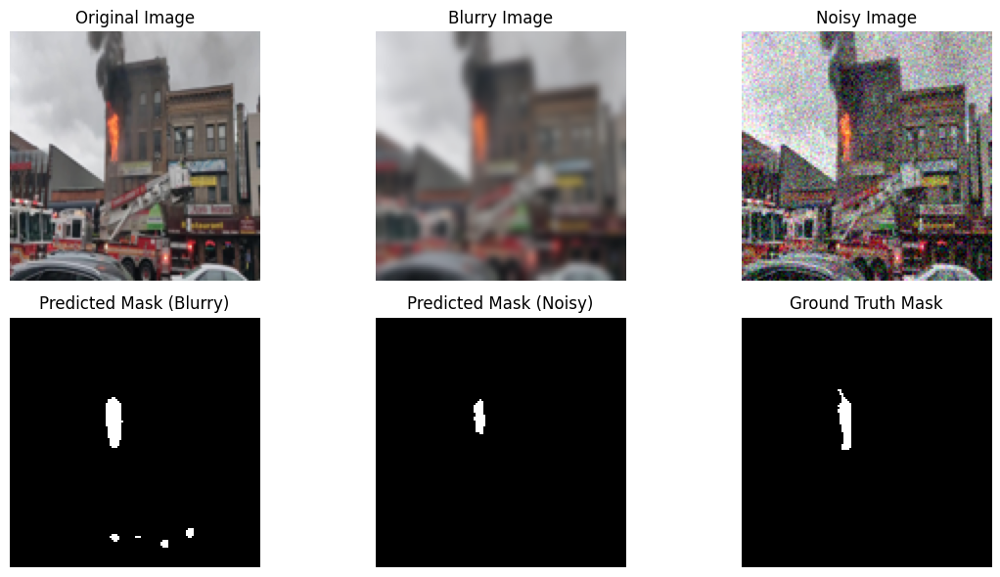

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import random

# Pick one random image from validation set
idx = random.randint(0, len(X_val)-1)
original = (X_val[idx] * 255).astype(np.uint8)

# 🔹 Add Gaussian Blur
blurred = cv2.GaussianBlur(original, (11, 11), 0)

# 🔹 Add Gaussian Noise
noise = np.random.normal(0, 25, original.shape).astype(np.int16)
noisy = np.clip(original + noise, 0, 255).astype(np.uint8)

# 🔹 Model predictions on noisy and blurry versions
pred_blur = model.predict(np.expand_dims(blurred/255.0, axis=0))[0].squeeze()
pred_noise = model.predict(np.expand_dims(noisy/255.0, axis=0))[0].squeeze()

# 🔹 Threshold to binary masks
pred_blur_mask = (pred_blur > 0.5).astype(np.uint8)
pred_noise_mask = (pred_noise > 0.5).astype(np.uint8)

# 🔹 Display all
plt.figure(figsize=(12,6))

plt.subplot(2,3,1)
plt.imshow(original)
plt.title("Original Image")
plt.axis('off')

plt.subplot(2,3,2)
plt.imshow(blurred)
plt.title("Blurry Image")
plt.axis('off')

plt.subplot(2,3,3)
plt.imshow(noisy)
plt.title("Noisy Image")
plt.axis('off')

plt.subplot(2,3,4)
plt.imshow(pred_blur_mask, cmap='gray')
plt.title("Predicted Mask (Blurry)")
plt.axis('off')

plt.subplot(2,3,5)
plt.imshow(pred_noise_mask, cmap='gray')
plt.title("Predicted Mask (Noisy)")
plt.axis('off')

plt.subplot(2,3,6)
plt.imshow(y_val[idx].squeeze(), cmap='gray')
plt.title("Ground Truth Mask")
plt.axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
from sklearn.metrics import accuracy_score, jaccard_score

# ✅ Predict on validation set
print("Predicting on validation data...")
y_pred = model.predict(X_val)
y_pred = (y_pred > 0.5).astype(np.uint8)

# ✅ Flatten all arrays for metric calculation
y_true_flat = y_val.flatten()
y_pred_flat = y_pred.flatten()

# ✅ Calculate metrics
dice = (2.0 * np.sum(y_true_flat * y_pred_flat)) / (np.sum(y_true_flat) + np.sum(y_pred_flat) + 1e-7)
iou  = jaccard_score(y_true_flat, y_pred_flat, average='binary')
acc  = accuracy_score(y_true_flat, y_pred_flat)

# ✅ Print results
print("\n📊 Evaluation Results:")
print(f"✅ Accuracy: {acc * 100:.2f}%")
print(f"✅ Dice Coefficient: {dice:.4f}")
print(f"✅ IoU (Jaccard Index): {iou:.4f}")


Predicting on validation data...
4/4 ━━━━━━━━━━━━━━━━━━━━ 65s 12s/step

📊 Evaluation Results:
✅ Accuracy: 98.89%
✅ Dice Coefficient: 0.8693
✅ IoU (Jaccard Index): 0.7688


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os
save_dir = "/content/drive/MyDrive/Fire_UNet_Models"
os.makedirs(save_dir, exist_ok=True)

# 🔹 Save final model
model_path = os.path.join(save_dir, "unet_final.h5")
model.save(model_path)
print("✅ Model saved successfully at:", model_path)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
✅ Model saved successfully at: /content/drive/MyDrive/Fire_UNet_Models/unet_final.h5


In [ ]:
import os

model_path = "/content/drive/MyDrive/Fire_UNet_Models/unet_final.h5"

if os.path.exists(model_path):
    print("✅ Model file found at:", model_path)
else:
    print("❌ Model not found. Check the path again.")


✅ Model file found at: /content/drive/MyDrive/Fire_UNet_Models/unet_final.h5


In [ ]:
# Whenever you want to use or test your saved model again, simply run this in any Colab notebook
from google.colab import drive
drive.mount('/content/drive')

from tensorflow.keras.models import load_model

# Custom loss and metric functions used earlier
def dice_coef(y_true, y_pred, smooth=1e-6):
    import tensorflow as tf
    y_true_f = tf.reshape(y_true, [-1])
    y_pred_f = tf.reshape(y_pred, [-1])
    intersection = tf.reduce_sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)

def dice_loss(y_true, y_pred):
    return 1.0 - dice_coef(y_true, y_pred)

def bce_dice_loss(y_true, y_pred):
    import tensorflow as tf
    bce = tf.keras.losses.BinaryCrossentropy()(y_true, y_pred)
    return bce + dice_loss(y_true, y_pred)

# Load your saved model
model_path = "/content/drive/MyDrive/Fire_UNet_Models/unet_final.h5"
model = load_model(model_path, custom_objects={'dice_coef': dice_coef, 'bce_dice_loss': bce_dice_loss})
print("✅ Model loaded successfully!")


Mounted at /content/drive


✅ Model loaded successfully!


# THERMAL IMAGE

In [ ]:
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
RGB_PATH = "/content/drive/MyDrive/Flame2_Dataset/254p_RGB"
THERMAL_PATH = "/content/drive/MyDrive/Flame2_Dataset/254p_Thermal"



In [ ]:
import os
print(os.listdir("/content/drive/MyDrive"))


['Colab Notebooks', 'Fire_Image_Dataset', 'Fire_UNet_Models', ' Flame2_Dataset']


In [ ]:
BASE = "/content/drive/MyDrive/ Flame2_Dataset"


In [ ]:
RGB_PATH = BASE + "/254p_RGB"
THERMAL_PATH = BASE + "/254p_Thermal"


In [9]:
import os
print("RGB:", len(os.listdir(RGB_PATH)))
print("Thermal:", len(os.listdir(THERMAL_PATH)))


RGB: 31178
Thermal: 38030


In [10]:
# quick test — run this cell
BASE = "/content/drive/MyDrive/ Flame2_Dataset"
RGB_PATH = BASE + "/254p_RGB"
THERMAL_PATH = BASE + "/254p_Thermal"

import os
print("BASE exists?", os.path.exists(BASE))
print("RGB path:", RGB_PATH, "->", "OK" if os.path.exists(RGB_PATH) else "MISSING")
print("Thermal path:", THERMAL_PATH, "->", "OK" if os.path.exists(THERMAL_PATH) else "MISSING")
print("RGB count:", len(os.listdir(RGB_PATH)) if os.path.exists(RGB_PATH) else 0)
print("Thermal count:", len(os.listdir(THERMAL_PATH)) if os.path.exists(THERMAL_PATH) else 0)


BASE exists? True
RGB path: /content/drive/MyDrive/ Flame2_Dataset/254p_RGB -> OK
Thermal path: /content/drive/MyDrive/ Flame2_Dataset/254p_Thermal -> OK
RGB count: 31178
Thermal count: 38030


In [11]:
import os, shutil
from sklearn.model_selection import train_test_split

BASE = "/content/drive/MyDrive/ Flame2_Dataset"
RGB_PATH = BASE + "/254p_RGB"
THERMAL_PATH = BASE + "/254p_Thermal"

OUT = "/content/processed_flame2"
os.makedirs(OUT, exist_ok=True)


In [12]:
folders = [
    "train/rgb", "train/thermal",
    "val/rgb", "val/thermal",
]
for f in folders:
    os.makedirs(os.path.join(OUT, f), exist_ok=True)


In [13]:
import os

rgb_files = sorted(os.listdir(RGB_PATH))
th_files  = sorted(os.listdir(THERMAL_PATH))

print("RGB files:", len(rgb_files))
print("Thermal files:", len(th_files))


RGB files: 31178
Thermal files: 38030


In [14]:
min_len = min(len(rgb_files), len(th_files))
rgb_files = rgb_files[:min_len]
th_files  = th_files[:min_len]

print("Paired after trimming:", len(rgb_files))


Paired after trimming: 31178


In [15]:
paired = list(zip(rgb_files, th_files))
print("Total paired samples:", len(paired))


Total paired samples: 31178


In [16]:
#split into train/val
from sklearn.model_selection import train_test_split

train_pairs, val_pairs = train_test_split(paired, test_size=0.2, random_state=42)

print("Train:", len(train_pairs))
print("Val:", len(val_pairs))


Train: 24942
Val: 6236


In [20]:
import os, random
from sklearn.model_selection import train_test_split

# Correct paths
BASE = "/content/drive/MyDrive/ Flame2_Dataset"
RGB_PATH = BASE + "/254p_RGB"
THERMAL_PATH = BASE + "/254p_Thermal"

# Check folder names exist
print("RGB exists:", os.path.exists(RGB_PATH))
print("Thermal exists:", os.path.exists(THERMAL_PATH))

# list files and pair them
rgb_files = sorted(os.listdir(RGB_PATH))
th_files  = sorted(os.listdir(THERMAL_PATH))
min_len = min(len(rgb_files), len(th_files))

# restrict to same length
rgb_files = rgb_files[:min_len]
th_files  = th_files[:min_len]
pairs = list(zip(rgb_files, th_files))

# train/val split
train_pairs, val_pairs = train_test_split(pairs, test_size=0.15, random_state=42)

print("Train pairs:", len(train_pairs), "Val pairs:", len(val_pairs))


RGB exists: True
Thermal exists: True
Train pairs: 26501 Val pairs: 4677


In [21]:
from tqdm import tqdm
import shutil, os

# Create the folders
OUT = "/content/processed_flame2"
folders = ["train/rgb","train/thermal","val/rgb","val/thermal"]
for f in folders:
    os.makedirs(os.path.join(OUT,f), exist_ok=True)

# Copy TRAIN with progress bar
print("Copying TRAIN...")
for rgb, th in tqdm(train_pairs, total=len(train_pairs)):
    shutil.copy(os.path.join(RGB_PATH, rgb), os.path.join(OUT, "train/rgb", rgb))
    shutil.copy(os.path.join(THERMAL_PATH, th), os.path.join(OUT, "train/thermal", th))

# Copy VAL with progress bar
print("Copying VAL...")
for rgb, th in tqdm(val_pairs, total=len(val_pairs)):
    shutil.copy(os.path.join(RGB_PATH, rgb), os.path.join(OUT, "val/rgb", rgb))
    shutil.copy(os.path.join(THERMAL_PATH, th), os.path.join(OUT, "val/thermal", th))

print("Finished copying!")


Copying TRAIN...


100%|██████████| 26501/26501 [4:44:47<00:00,  1.55it/s]


Copying VAL...


100%|██████████| 4677/4677 [54:15<00:00,  1.44it/s]

Finished copying!


In [22]:
!cp -r /content/processed_flame2 "/content/drive/MyDrive/"


In [46]:
import os, random, glob
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, Model, Input
import matplotlib.pyplot as plt

# Path to the processed dataset you just created
BASE = "/content/processed_flame2"

TRAIN_RGB_DIR = os.path.join(BASE, "train", "rgb")
TRAIN_TH_DIR  = os.path.join(BASE, "train", "thermal")
VAL_RGB_DIR   = os.path.join(BASE, "val", "rgb")
VAL_TH_DIR    = os.path.join(BASE, "val", "thermal")

IMG_SIZE  = (160, 160)
BATCH     = 8
EPOCHS    = 20
AUTOTUNE  = tf.data.AUTOTUNE

print("Train RGB:", len(os.listdir(TRAIN_RGB_DIR)))
print("Train TH :", len(os.listdir(TRAIN_TH_DIR)))
print("Val   RGB:", len(os.listdir(VAL_RGB_DIR)))
print("Val   TH :", len(os.listdir(VAL_TH_DIR)))


Train RGB: 26501
Train TH : 26501
Val   RGB: 4677
Val   TH : 4677


In [29]:
def get_pairs(rgb_dir, th_dir):
    rgb_files = sorted(glob.glob(os.path.join(rgb_dir, "*")))
    th_files  = sorted(glob.glob(os.path.join(th_dir, "*")))
    m = min(len(rgb_files), len(th_files))
    rgb_files = rgb_files[:m]
    th_files  = th_files[:m]
    print("Paired:", m)
    return rgb_files, th_files

train_rgb_paths, train_th_paths = get_pairs(TRAIN_RGB_DIR, TRAIN_TH_DIR)
val_rgb_paths,   val_th_paths   = get_pairs(VAL_RGB_DIR,   VAL_TH_DIR)


Paired: 26501
Paired: 4677


Loader: read RGB + Thermal & create pseudo mask


In [31]:
def build_dataset(rgb_paths, th_paths, training=True):
    def _load_pair(rgb_path, th_path):
        # Load RGB
        rgb = tf.io.read_file(rgb_path)
        rgb = tf.io.decode_jpeg(rgb, channels=3)
        rgb = tf.image.resize(rgb, IMG_SIZE)
        rgb = tf.cast(rgb, tf.float32) / 255.0

        # Load Thermal
        th = tf.io.read_file(th_path)
        th = tf.io.decode_jpeg(th, channels=1)
        th = tf.image.resize(th, IMG_SIZE)
        th = tf.cast(th, tf.float32) / 255.0

        # Threshold as mask (pseudo label)
        mask = tf.where(th > 0.3, 1.0, 0.0)

        return {"rgb": rgb, "thermal": th}, mask

    ds = tf.data.Dataset.from_tensor_slices((rgb_paths, th_paths))
    ds = ds.map(_load_pair, num_parallel_calls=AUTOTUNE)

    if training:
        ds = ds.shuffle(2000, seed=42)

    ds = ds.batch(BATCH).prefetch(AUTOTUNE)
    return ds


In [33]:
import glob, os

train_rgb_paths = sorted(glob.glob(os.path.join(TRAIN_RGB_DIR, "*.jpg")))
train_th_paths  = sorted(glob.glob(os.path.join(TRAIN_TH_DIR, "*.jpg")))
val_rgb_paths   = sorted(glob.glob(os.path.join(VAL_RGB_DIR, "*.jpg")))
val_th_paths    = sorted(glob.glob(os.path.join(VAL_TH_DIR, "*.jpg")))


In [47]:
# ⚡ FAST TRAINING SUBSET
train_rgb_paths = train_rgb_paths[:1200]
train_th_paths  = train_th_paths[:1200]

val_rgb_paths   = val_rgb_paths[:200]
val_th_paths    = val_th_paths[:200]

print("Using:", len(train_rgb_paths), "training pairs,", len(val_rgb_paths), "validation pairs.")


Using: 1200 training pairs, 200 validation pairs.


In [48]:
train_ds = build_dataset(train_rgb_paths, train_th_paths, training=True)
val_ds   = build_dataset(val_rgb_paths, val_th_paths, training=False)


In [35]:
sample = next(iter(train_ds))
print("RGB batch:", sample[0]["rgb"].shape)
print("Thermal batch:", sample[0]["thermal"].shape)
print("Mask batch:", sample[1].shape)


RGB batch: (8, 256, 256, 3)
Thermal batch: (8, 256, 256, 1)
Mask batch: (8, 256, 256, 1)


In [50]:
from tensorflow.keras import layers, Model, Input

IMG_SIZE = (160, 160)  # make sure this matches what you used before

def conv_block(x, filters):
    x = layers.Conv2D(filters, 3, padding='same', activation='relu')(x)
    x = layers.Conv2D(filters, 3, padding='same', activation='relu')(x)
    return x

def encoder_branch(inp, filters_list):
    skips = []
    x = inp
    for f in filters_list:
        c = conv_block(x, f)
        skips.append(c)
        x = layers.MaxPool2D(2)(c)
    return x, skips

def decoder_block(x, skip, filters):
    x = layers.Conv2DTranspose(filters, 2, strides=2, padding='same')(x)
    x = layers.Concatenate()([x, skip])
    x = conv_block(x, filters)
    return x

def build_fusion_unet(img_size=IMG_SIZE):
    #  names MUST match dataset dict keys: 'rgb' and 'thermal'
    rgb_in = Input((*img_size, 3), name="rgb")
    thermal_in  = Input((*img_size, 1), name="thermal")

    # encoders
    enc_rgb, skips_rgb = encoder_branch(rgb_in, [32, 64, 128, 256])
    enc_th,  skips_th  = encoder_branch(thermal_in,  [16, 32,  64, 128])

    # fuse at bottleneck
    fused = layers.Concatenate()([enc_rgb, enc_th])
    b     = conv_block(fused, 512)

    # decoder with fused skips
    d1 = decoder_block(b,  layers.Concatenate()([skips_rgb[3], skips_th[3]]), 256)
    d2 = decoder_block(d1, layers.Concatenate()([skips_rgb[2], skips_th[2]]), 128)
    d3 = decoder_block(d2, layers.Concatenate()([skips_rgb[1], skips_th[1]]),  64)
    d4 = decoder_block(d3, layers.Concatenate()([skips_rgb[0], skips_th[0]]),  32)

    out = layers.Conv2D(1, 1, activation='sigmoid')(d4)
    model = Model(inputs=[rgb_in, thermal_in], outputs=out)
    return model

model = build_fusion_unet()
model.summary()


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ rgb (InputLayer)    │ (None, 160, 160,  │          0 │ -                 │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ thermal             │ (None, 160, 160,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_54 (Conv2D)  │ (None, 160, 160,  │        896 │ rgb[0][0]         │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_62 (Conv2D)  │ (None, 160, 160,  │        160 │ thermal[0][0]     │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_55 (Conv2D)  │ (None, 160, 160,  │      9,248 │ conv2d_54[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_63 (Conv2D)  │ (None, 160, 160,  │      2,320 │ conv2d_62[0][0]   │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_16    │ (None, 80, 80,    │          0 │ conv2d_55[0][0]   │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_20    │ (None, 80, 80,    │          0 │ conv2d_63[0][0]   │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_56 (Conv2D)  │ (None, 80, 80,    │     18,496 │ max_pooling2d_16… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_64 (Conv2D)  │ (None, 80, 80,    │      4,640 │ max_pooling2d_20… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_57 (Conv2D)  │ (None, 80, 80,    │     36,928 │ conv2d_56[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_65 (Conv2D)  │ (None, 80, 80,    │      9,248 │ conv2d_64[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_17    │ (None, 40, 40,    │          0 │ conv2d_57[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_21    │ (None, 40, 40,    │          0 │ conv2d_65[0][0]   │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_58 (Conv2D)  │ (None, 40, 40,    │     73,856 │ max_pooling2d_17… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_66 (Conv2D)  │ (None, 40, 40,    │     18,496 │ max_pooling2d_21… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_59 (Conv2D)  │ (None, 40, 40,    │    147,584 │ conv2d_58[0][0] 

 Total params: 9,034,833 (34.47 MB)

 Trainable params: 9,034,833 (34.47 MB)

 Non-trainable params: 0 (0.00 B)

In [51]:
import tensorflow as tf
import tensorflow.keras.backend as K

def dice_coef(y_true, y_pred, smooth=1e-6):
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    inter = K.sum(y_true_f * y_pred_f)
    return (2. * inter + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def bce_dice_loss(y_true, y_pred):
    bce  = tf.keras.losses.BinaryCrossentropy()(y_true, y_pred)
    dice = 1.0 - dice_coef(y_true, y_pred)
    return bce + dice

model.compile(optimizer="adam", loss=bce_dice_loss, metrics=[dice_coef])

ckpt_path = "/content/fusion_unet_flame2_best.h5"
callbacks = [
    tf.keras.callbacks.ModelCheckpoint(ckpt_path, save_best_only=True, monitor="val_loss"),
    tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3),
    tf.keras.callbacks.EarlyStopping(monitor="val_loss", patience=6, restore_best_weights=True),
]

#  train_ds and val_ds must yield: ({'rgb': rgb, 'thermal': th}, mask)
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=3,               # only 3 epochs
    steps_per_epoch=60,     # faster
    validation_steps=20,    # faster
    callbacks=callbacks
)



Epoch 1/3
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - dice_coef: 0.8150 - loss: 0.4978

60/60 ━━━━━━━━━━━━━━━━━━━━ 518s 8s/step - dice_coef: 0.8165 - loss: 0.4941 - val_dice_coef: 0.9585 - val_loss: 0.1467 - learning_rate: 0.0010
Epoch 2/3
60/60 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - dice_coef: 0.9598 - loss: 0.1294

60/60 ━━━━━━━━━━━━━━━━━━━━ 493s 8s/step - dice_coef: 0.9599 - loss: 0.1291 - val_dice_coef: 0.9728 - val_loss: 0.0816 - learning_rate: 0.0010
Epoch 3/3
30/60 ━━━━━━━━━━━━━━━━━━━━ 3:44 7s/step - dice_coef: 0.9776 - loss: 0.0702

/usr/local/lib/python3.12/dist-packages/keras/src/trainers/epoch_iterator.py:116: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


60/60 ━━━━━━━━━━━━━━━━━━━━ 323s 5s/step - dice_coef: 0.9771 - loss: 0.0718 - val_dice_coef: 0.9770 - val_loss: 0.0697 - learning_rate: 0.0010


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step


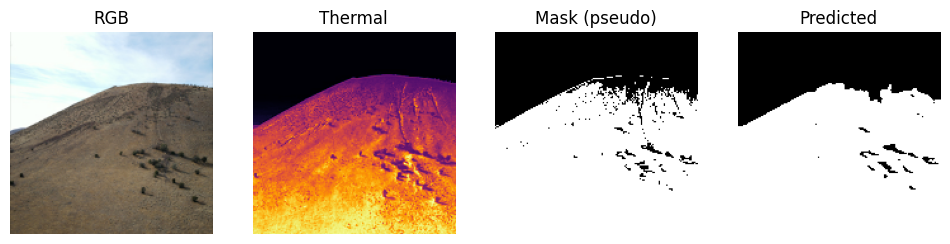

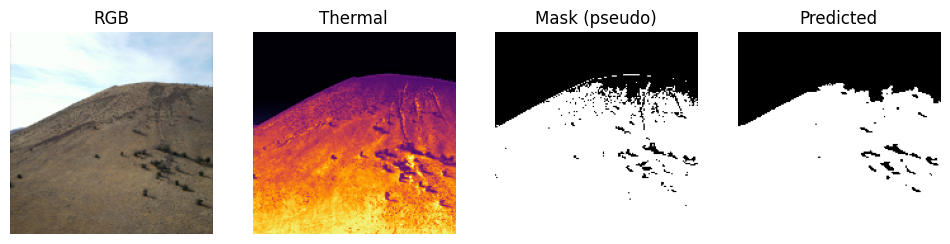

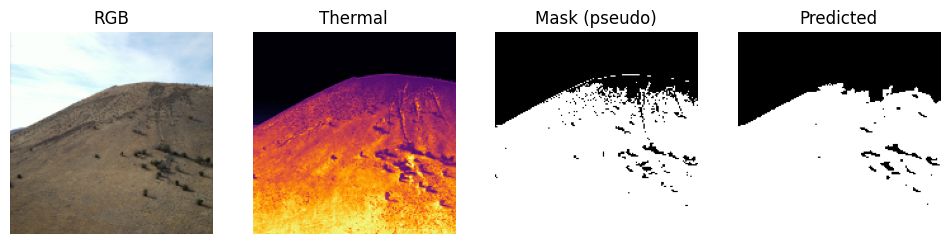

In [52]:
import matplotlib.pyplot as plt
import numpy as np

def show_samples(model, dataset, num=3):
    inputs, masks = next(iter(dataset))      # inputs is a dict: {'rgb':..., 'thermal':...}
    rgb_batch = inputs['rgb']
    th_batch  = inputs['thermal']

    preds = model.predict({'rgb': rgb_batch, 'thermal': th_batch})

    for i in range(min(num, rgb_batch.shape[0])):
        rgb = rgb_batch[i].numpy()
        th  = th_batch[i, :, :, 0].numpy()
        gt  = masks[i, :, :, 0].numpy()
        pr  = preds[i, :, :, 0]
        pr_bin = (pr > 0.5).astype(np.float32)

        plt.figure(figsize=(12,4))
        plt.subplot(1,4,1); plt.title("RGB");           plt.imshow(rgb);              plt.axis("off")
        plt.subplot(1,4,2); plt.title("Thermal");       plt.imshow(th, cmap="inferno"); plt.axis("off")
        plt.subplot(1,4,3); plt.title("Mask (pseudo)"); plt.imshow(gt, cmap="gray");  plt.axis("off")
        plt.subplot(1,4,4); plt.title("Predicted");     plt.imshow(pr_bin, cmap="gray"); plt.axis("off")
        plt.show()

show_samples(model, val_ds, num=3)


In [61]:
import numpy as np
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score

# =======================
#  Post-Processing + Metrics
# =======================

def evaluate_model(model, dataset, threshold=0.5):
    y_true = []
    y_pred = []

    for inputs, masks in dataset:
        preds = model.predict({"rgb": inputs["rgb"], "thermal": inputs["thermal"]})
        preds_bin = (preds > threshold).astype(np.uint8)

        y_true.append(masks.numpy().astype(np.uint8))
        y_pred.append(preds_bin.astype(np.uint8))

    y_true = np.concatenate(y_true, axis=0).flatten()
    y_pred = np.concatenate(y_pred, axis=0).flatten()

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, zero_division=0)
    recall = recall_score(y_true, y_pred, zero_division=0)
    f1 = f1_score(y_true, y_pred, zero_division=0)

    # IoU
    intersection = np.logical_and(y_true, y_pred).sum()
    union = np.logical_or(y_true, y_pred).sum()
    iou = intersection / (union + 1e-7)

    # Dice Score (optional)
    dice = (2 * intersection) / (y_true.sum() + y_pred.sum() + 1e-7)

    return accuracy, precision, recall, f1, iou, dice

# =======================
# Run Evaluation
# =======================

acc, prec, rec, f1, iou, dice = evaluate_model(model, val_ds)

print("\n🔥 **Model Evaluation Metrics** 🔥")
print("--------------------------------")
print(f"📌 Accuracy:   {acc:.4f}")
print(f"🎯 Precision:  {prec:.4f}")
print(f"📈 Recall:     {rec:.4f}")
print(f"⭐ F1 Score:    {f1:.4f}")
print(f"🧮 IoU:         {iou:.4f}")
print(f"🔁 Dice Score:  {dice:.4f}")


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step

🔥 **Model Evaluation Metrics** 🔥
--------------------------------
📌 Accuracy:   0.9816
🎯 Precision:

In [78]:
import os, cv2, numpy as np

RGB_DIR = "/content/processed_flame2/val/rgb/"

def is_forest_fire(img_path):
    img = cv2.imread(img_path)
    if img is None:
        return False

    # Convert to HSV
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Detect green (trees)
    lower_green = np.array([25, 20, 20])
    upper_green = np.array([95, 255, 255])
    green_mask = cv2.inRange(hsv, lower_green, upper_green)

    # Detect smoke/white/grey
    lower_smoke = np.array([0, 0, 180])
    upper_smoke = np.array([180, 60, 255])
    smoke_mask = cv2.inRange(hsv, lower_smoke, upper_smoke)

    # Condition: forest + smoke/fire area exists
    return cv2.countNonZero(green_mask) > 5000 and cv2.countNonZero(smoke_mask) > 8000

forest_fire_ids = []

for f in os.listdir(RGB_DIR):
    rgb_path = os.path.join(RGB_DIR, f)
    if is_forest_fire(rgb_path):
        forest_fire_ids.append(f)

print("🔥 Forest Fire Candidates Found:", len(forest_fire_ids))
forest_fire_ids[:5]


🔥 Forest Fire Candidates Found: 1672


['254p RGB Frame (22800).jpg',
 '254p RGB Frame (25472).jpg',
 '254p RGB Frame (25311).jpg',
 '254p RGB Frame (24488).jpg',
 '254p RGB Frame (31823).jpg']

In [79]:
import re, os

THERMAL_DIR = "/content/processed_flame2/val/thermal/"

def get_id(filename):
    m = re.findall(r"\((\d+)\)", filename)
    return m[0] if m else None

valid_pairs = []

for rgb in forest_fire_ids:
    rgb_id = get_id(rgb)
    for th in os.listdir(THERMAL_DIR):
        if get_id(th) == rgb_id:
            valid_pairs.append((rgb, th))
            break

print("🔥 Valid Forest Fire Pairs:", len(valid_pairs))
valid_pairs[:3]


🔥 Valid Forest Fire Pairs: 263


[('254p RGB Frame (31199).jpg', '254p Thermal Frame (31199).jpg'),
 ('254p RGB Frame (34867).jpg', '254p Thermal Frame (34867).jpg'),
 ('254p RGB Frame (22843).jpg', '254p Thermal Frame (22843).jpg')]

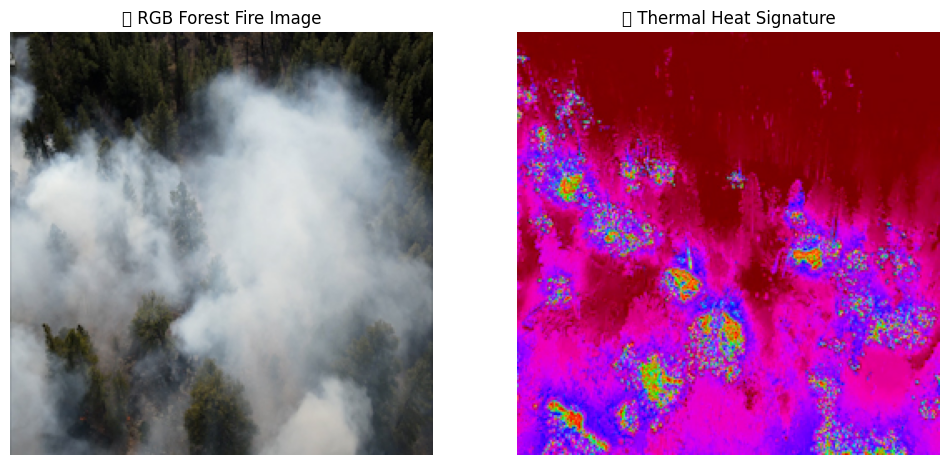

Displaying:
RGB: 254p RGB Frame (31199).jpg
THERMAL: 254p Thermal Frame (31199).jpg


In [80]:
from PIL import Image
import matplotlib.pyplot as plt

rgb_file, thermal_file = valid_pairs[0]

rgb_img = Image.open(os.path.join(RGB_DIR, rgb_file))
thermal_img = Image.open(os.path.join(THERMAL_DIR, thermal_file))

plt.figure(figsize=(12,6))

plt.subplot(1,2,1)
plt.title("🌲 RGB Forest Fire Image")
plt.imshow(rgb_img)
plt.axis("off")

plt.subplot(1,2,2)
plt.title("🔥 Thermal Heat Signature")
plt.imshow(thermal_img, cmap="inferno")
plt.axis("off")

plt.show()

print("Displaying:")
print("RGB:", rgb_file)
print("THERMAL:", thermal_file)


/tmp/ipython-input-414968781.py:28: UserWarning: Glyph 127794 (\N{EVERGREEN TREE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-414968781.py:28: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()


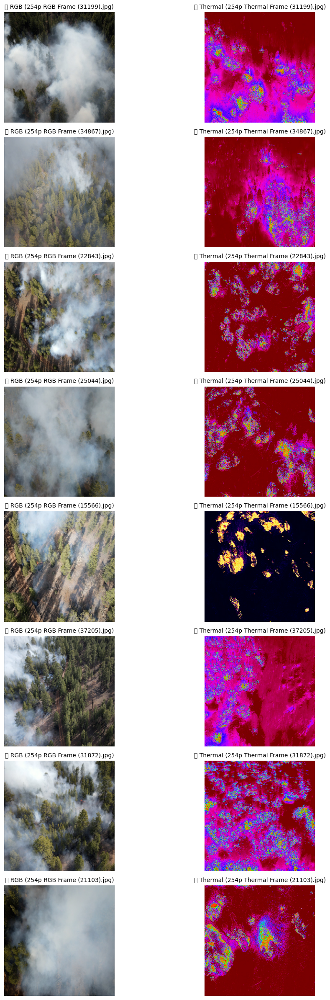

In [81]:
import matplotlib.pyplot as plt
import os
from PIL import Image

# How many samples to show?
N_SAMPLES = 8  # you can change to 6, 10, 12 etc.

plt.figure(figsize=(12, 3*N_SAMPLES))

for i in range(N_SAMPLES):
    rgb_file, thermal_file = valid_pairs[i]

    rgb_img = Image.open(os.path.join(RGB_DIR, rgb_file))
    thermal_img = Image.open(os.path.join(THERMAL_DIR, thermal_file))

    # RGB plot
    plt.subplot(N_SAMPLES, 2, 2*i + 1)
    plt.title(f"🌲 RGB ({rgb_file})", fontsize=10)
    plt.imshow(rgb_img)
    plt.axis("off")

    # Thermal plot
    plt.subplot(N_SAMPLES, 2, 2*i + 2)
    plt.title(f"🔥 Thermal ({thermal_file})", fontsize=10)
    plt.imshow(thermal_img, cmap="inferno")
    plt.axis("off")

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 718ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 669ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 814ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 462ms/step


/tmp/ipython-input-3762639729.py:47: UserWarning: Glyph 127794 (\N{EVERGREEN TREE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3762639729.py:47: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-3762639729.py:47: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128269 (\N{LEFT-POINTING MAGNIFYING GLASS}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


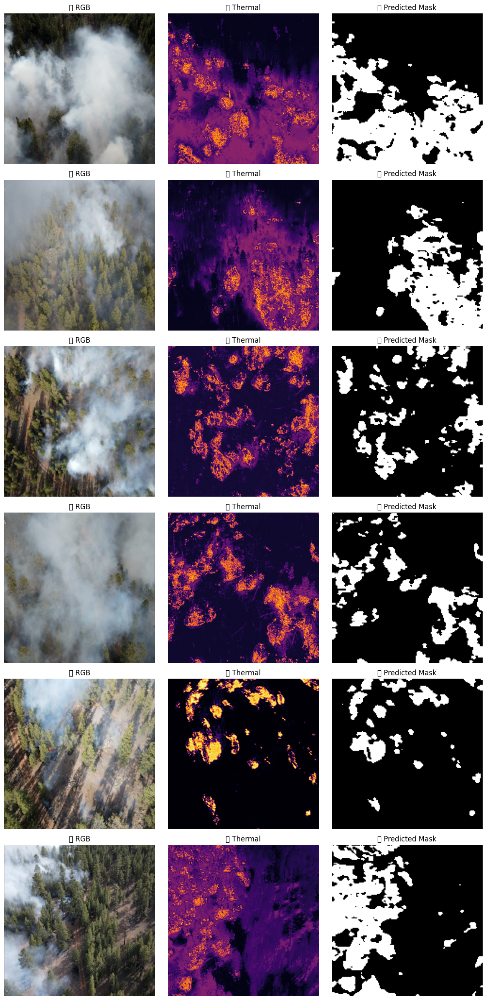

In [82]:
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import os

# How many samples to visualize?
N_SAMPLES = 6   # change if you want more

def show_forest_predictions(model, pairs, n=N_SAMPLES):
    plt.figure(figsize=(12, 4*n))

    for i in range(n):
        rgb_file, thermal_file = pairs[i]

        # Load RGB
        rgb_img = Image.open(os.path.join(RGB_DIR, rgb_file))
        rgb_np  = np.array(rgb_img.resize((160,160))) / 255.0

        # Load THERMAL
        th_img = Image.open(os.path.join(THERMAL_DIR, thermal_file)).convert("L")
        th_np  = np.array(th_img.resize((160,160))) / 255.0
        th_np  = np.expand_dims(th_np, axis=-1)

        # Model Prediction
        pred = model.predict({"rgb": np.array([rgb_np]), "thermal": np.array([th_np])})
        pred_bin = (pred[0,:,:,0] > 0.5).astype(float)

        # ------- PLOT -------
        # 1) RGB
        plt.subplot(n,3,3*i+1)
        plt.title("🌲 RGB")
        plt.imshow(rgb_img)
        plt.axis("off")

        # 2) Thermal
        plt.subplot(n,3,3*i+2)
        plt.title("🔥 Thermal")
        plt.imshow(th_img, cmap="inferno")
        plt.axis("off")

        # 3) Mask Prediction
        plt.subplot(n,3,3*i+3)
        plt.title("🔍 Predicted Mask")
        plt.imshow(pred_bin, cmap="gray")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# ▶ Run the function
show_forest_predictions(model, valid_pairs, n=N_SAMPLES)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 412ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 434ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 430ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 665ms/step


/tmp/ipython-input-924413349.py:54: UserWarning: Glyph 127794 (\N{EVERGREEN TREE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-924413349.py:54: UserWarning: Glyph 128293 (\N{FIRE}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipython-input-924413349.py:54: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127919 (\N{DIRECT HIT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


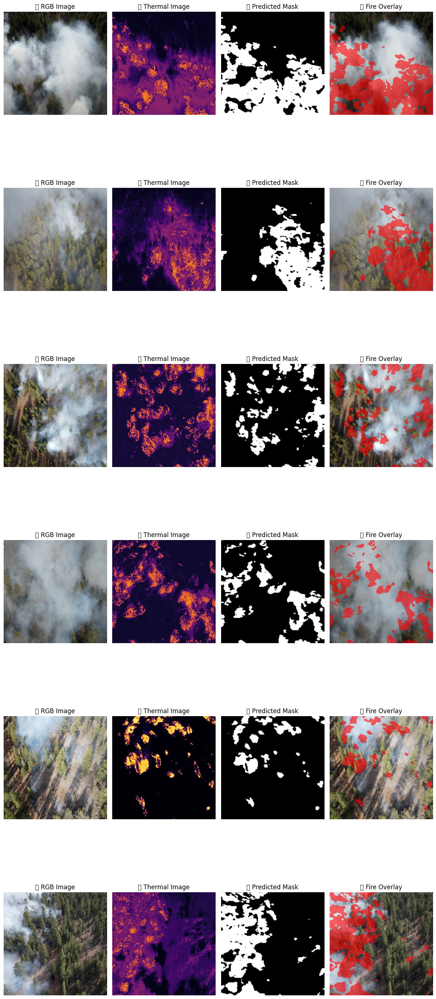

In [86]:
import matplotlib.pyplot as plt
import numpy as np
import os
from PIL import Image
import cv2

IMG_SIZE = (160,160)

def show_final_results(model, pairs, n=6):   # change n for more samples
    plt.figure(figsize=(12, 5*n))

    for i in range(n):
        rgb_file, thermal_file = pairs[i]

        # ---------------- RGB ----------------
        rgb_img = Image.open(os.path.join(RGB_DIR, rgb_file))
        rgb_resized = np.array(rgb_img.resize(IMG_SIZE)) / 255.0

        # ---------------- THERMAL ----------------
        th_img  = Image.open(os.path.join(THERMAL_DIR, thermal_file)).convert("L")
        th_resized = np.array(th_img.resize(IMG_SIZE)) / 255.0
        th_resized = np.expand_dims(th_resized, -1)

        # ---------------- PREDICTION ----------------
        pred = model.predict({"rgb": np.array([rgb_resized]), "thermal": np.array([th_resized])})
        pred_mask = (pred[0,:,:,0] > 0.5).astype(np.float32)

        # ---------------- OVERLAY ----------------
        overlay = rgb_resized.copy()
        overlay[pred_mask == 1] = [1, 0, 0]  # red
        fire_overlay = cv2.addWeighted(overlay, 0.6, rgb_resized, 0.4, 0)

        # ---------------- PLOTTING ----------------
        plt.subplot(n, 4, 4*i + 1)
        plt.title("🌲 RGB Image")
        plt.imshow(rgb_img)
        plt.axis("off")

        plt.subplot(n, 4, 4*i + 2)
        plt.title("🔥 Thermal Image")
        plt.imshow(th_img, cmap="inferno")
        plt.axis("off")

        plt.subplot(n, 4, 4*i + 3)
        plt.title("🎯 Predicted Mask")
        plt.imshow(pred_mask, cmap="gray")
        plt.axis("off")

        plt.subplot(n, 4, 4*i + 4)
        plt.title("🔥 Fire Overlay")
        plt.imshow(fire_overlay)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# ▶ Show results (change number if needed)
show_final_results(model, valid_pairs, n=6)
